In [201]:
import joblib as jb
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt

In [2]:
filepath = "../ml_project1_data.csv"
data = pd.read_csv(filepath)

In [3]:
# Get some info abou dataset

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [5]:
# Shallow Exploration using pandas-profiling

# Some considerations about dataset
- Before see data, i expect that people who have bought in others campaigns, has more chances to buy in the actual campaign (some strong correlation with response)(AcceptedCmpX)
- People who spents more money in others products, has more chances to buy in the actual campaign (some strong correlation with response)(MntXXX and NumXXX)
- People who have complained before, has less chances to buy in actual campaign
- I expected that people who bought ner-recently has more chances to buy our products
- I dont have any expectations in social features, but maybe we have some correlation with response.

In [6]:
from sklearn.preprocessing import LabelEncoder

In [7]:
le_marital = LabelEncoder()
# params_marital = {'Single': 0, 'Together': 1, 'Married': 1, 'Divorced': 0, 'Widow': 1, 'Alone': 0,
#                   'Absurd': 0, 'YOLO': 0}
# le_marital.set_params(params_marital)
data['Marital_Status'] = le_marital.fit_transform(data['Marital_Status'])
le_educational = LabelEncoder()
# params_educational = {'Graduation': 3, 'PhD': 5, 'Master': 4, 'Basic': 0, '2n Cycle': 1}
# le_educational.set_params(**params_educational)
data['Education'] = le_educational.fit_transform(data['Education'])

In [8]:
data.drop(columns=['Z_Revenue', 'Z_CostContact'], inplace=True)

In [9]:
from pandas_profiling import ProfileReport

In [10]:
profile = ProfileReport(data, title="Profiling consumers", html={'style':{'full_width':True}})
profile.to_notebook_iframe()

# Some considerations.
- MntXXX features has high correlation with each other, and have strong correlation with NumXXX features(Obs: Num WebPurchases has a negative correlation and NumDealsPurchases has weak correlation)
- NumWebVisitMonth has strong correlation with kidhome, isso nos indica que o aumento do numero de visitas ao site é muitas vezes ocasionado por crianças, que não compram produtos.
- AcceptedCmpX has a positive correlation with response, has high correlation with other AcceptedCMPX, MntXXX, NumXX
- Income has a medium positive correlation
- KidHome, Teenhome has a weak negative correlation with response and other AcceptedX.
- Analysing the perfect target(in according with correlation matrix), A pessoa precisa ter um bom nivel de educação, não ter filhos, gastar bastante com a feature MndXXX, ter comprado bastante em lojas fisicas/online ou por catalogo, ter comprado algo mais recentemente.

In [44]:
# Criando algumas features mais interessantes

In [ ]:
# Feature usando AcceptedXX

In [67]:
print("% of people who have bought the actual campaign and have bought the first one: ", round(len(data[(data.AcceptedCmp1 == 1) & (data.Response == 1)])/len(data[(data.AcceptedCmp1 == 1)])*100, 2), "%")
print("% of people who have bought the actual campaign and have bought the second one: ", round(len(data[(data.AcceptedCmp2 == 1) & (data.Response == 1)])/len(data[(data.AcceptedCmp2 == 1)])*100, 2), "%")
print("% of people who have bought the actual campaign and have bought the third one: ", round(len(data[(data.AcceptedCmp3 == 1) & (data.Response == 1)])/len(data[(data.AcceptedCmp3 == 1)])*100, 2), "%")
print("% of people who have bought the actual campaign and have bought the fourth one: ", round(len(data[(data.AcceptedCmp4 == 1) & (data.Response == 1)])/len(data[(data.AcceptedCmp4 == 1)])*100, 2), "%")
print("% of people who have bought the actual campaign and have bought the fifth one: ", round(len(data[(data.AcceptedCmp5 == 1) & (data.Response == 1)])/len(data[(data.AcceptedCmp5 == 1)])*100, 2), "%")
print("% of people who have bought the actual campaign and dont have bought in pasts campaigns: ", round(len(data[(data.AcceptedCmp1 == 0) & (data.AcceptedCmp2 == 0) & (data.AcceptedCmp3 == 0) & (data.AcceptedCmp4 == 0) & (data.AcceptedCmp5 == 0) & (data.Response == 1)])/len(data[(data.AcceptedCmp1 == 0) & (data.AcceptedCmp2 == 0) & (data.AcceptedCmp3 == 0) & (data.AcceptedCmp4 == 0) & (data.AcceptedCmp5 == 0)])*100, 2), "%")

% of people who have bought the actual campaign and have bought the first one:  54.86 %
% of people who have bought the actual campaign and have bought the second one:  66.67 %
% of people who have bought the actual campaign and have bought the third one:  47.24 %
% of people who have bought the actual campaign and have bought the fourth one:  37.13 %
% of people who have bought the actual campaign and have bought the fifth one:  56.44 %
% of people who have bought the actual campaign and dont have bought in pasts campaigns:  8.22 %


- We see that people who had bought in the second campaign has more chances to buy our product, maybe this campaign was better implemented, or reachs better targets
- People who have bought in the fourth campaign has minus chances to buy our product.

In [23]:
# Creating indicator of AcceptedCmpIncator
# A ideia principal aqui é criar um indicator que representa melhor a variavel resposta

In [24]:
data['AcceptedCmpIndicator'] = 1.5*data['AcceptedCmp1'] + 2*data['AcceptedCmp2'] + data['AcceptedCmp3'] + 0.5*data['AcceptedCmp4'] + 1.5*data['AcceptedCmp5']

In [30]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'AcceptedCmpIndicator'],
      dtype='object')

In [29]:
# Features MntXXX

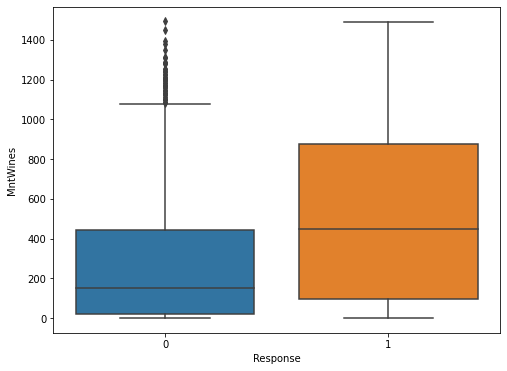

In [35]:
var = 'MntWines'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

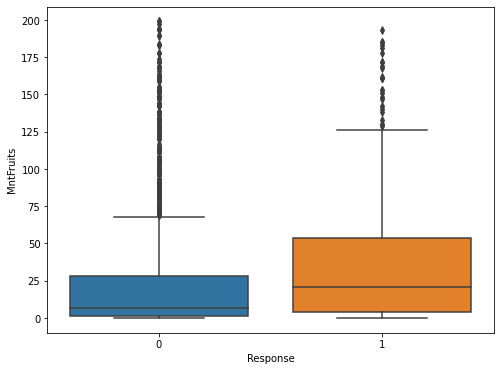

In [37]:
var = 'MntFruits'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

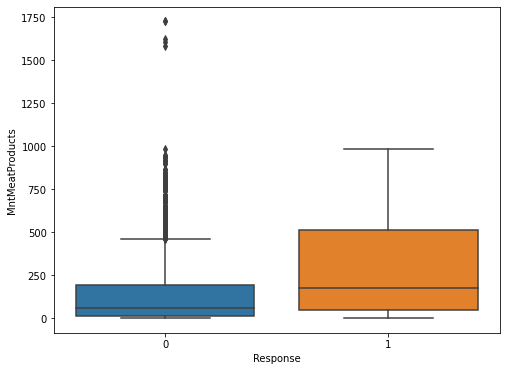

In [38]:
var = 'MntMeatProducts'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

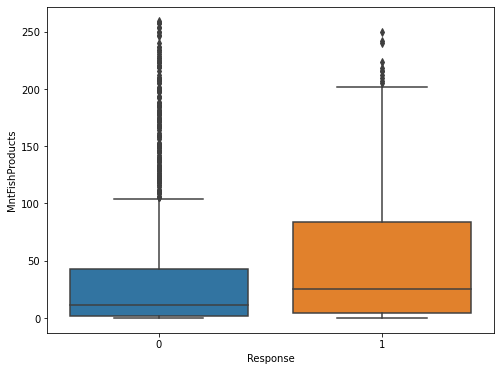

In [39]:
var = 'MntFishProducts'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

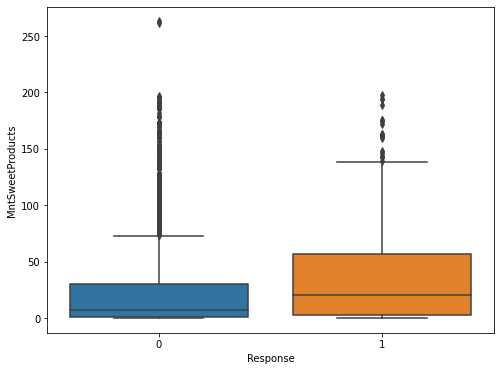

In [40]:
var = 'MntSweetProducts'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

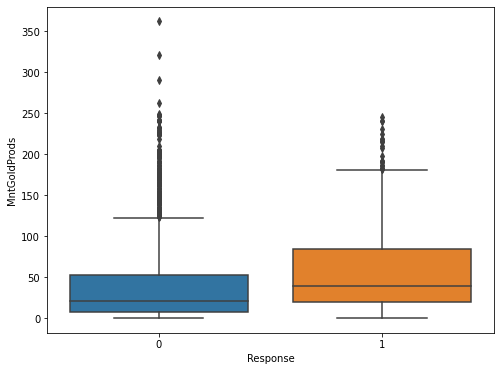

In [41]:
var = 'MntGoldProds'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)


In [42]:
# Em todos os casos, quem gasta com MntXXX tende a aceitar a nossa oferta

In [ ]:
# Criando feature que calcula o total gasto

In [49]:
data['TotalCost'] = data[['MntWines', 'MntFruits',
                          'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
                          'MntGoldProds']].sum(axis=1)

In [51]:
data[['MntWines', 'MntFruits',
      'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
      'MntGoldProds', 'TotalCost', 'Response']].corr()

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,TotalCost,Response
MntWines,1.000000,0.389637,0.562667,0.399753,0.386581,0.387516,0.891839,0.247254
MntFruits,0.389637,1.000000,0.543105,0.594804,0.567164,0.392995,0.614229,0.125289
MntMeatProducts,0.562667,0.543105,1.000000,0.568402,0.523846,0.350609,0.842965,0.236335
MntFishProducts,0.399753,0.594804,0.568402,1.000000,0.579870,0.422875,0.642818,0.111331
MntSweetProducts,0.386581,0.567164,0.523846,0.579870,1.000000,0.369724,0.603016,0.117372
MntGoldProds,0.387516,0.392995,0.350609,0.422875,0.369724,1.000000,0.524262,0.139850
TotalCost,0.891839,0.614229,0.842965,0.642818,0.603016,0.524262,1.000000,0.265298
Response,0.247254,0.125289,0.236335,0.111331,0.117372,0.139850,0.265298,1.000000


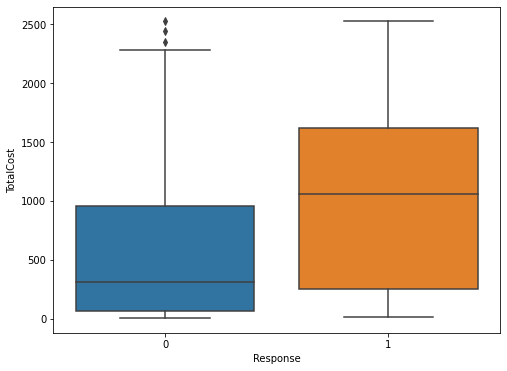

In [60]:
var = 'TotalCost'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

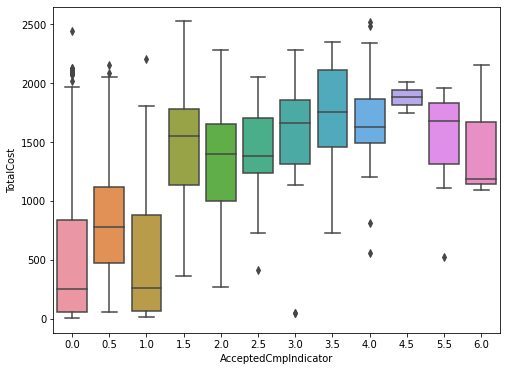

In [63]:
var = 'TotalCost'
sub_data = data[['AcceptedCmpIndicator', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='AcceptedCmpIndicator', y=var, data=sub_data)

In [65]:
# Esse ultimo grafico nos indica que pessoas que compraram mais promoções nossas, tendem a gastar mais em produtos pela internet
# O grande problema esta contido nas pessoas que não compraram nenhuma promoção, elas tambem gastaram bastante em alguns casos.

In [ ]:
# Features Nmp

In [72]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'AcceptedCmpIndicator',
       'TotalCost'],
      dtype='object')

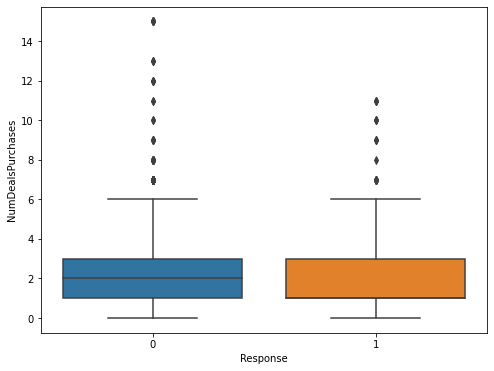

In [73]:
var = 'NumDealsPurchases'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [74]:
# num deals purchases nao tem correlçao com Responses

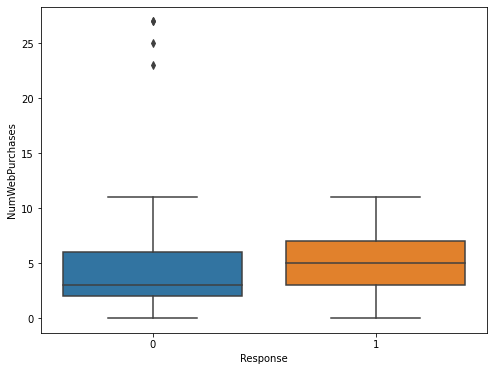

In [75]:
var = 'NumWebPurchases'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

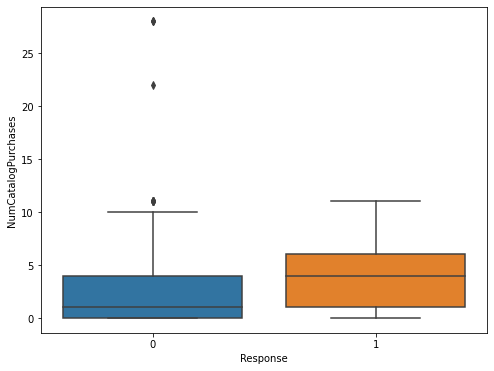

In [76]:
var = 'NumCatalogPurchases'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

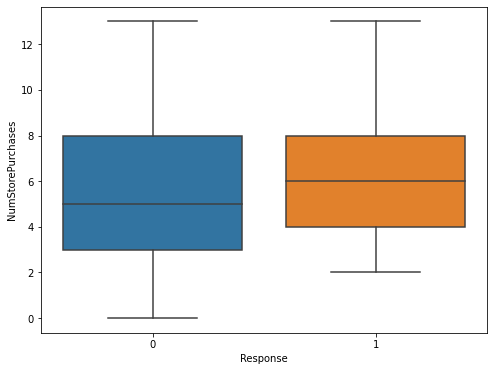

In [77]:
var = 'NumStorePurchases'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

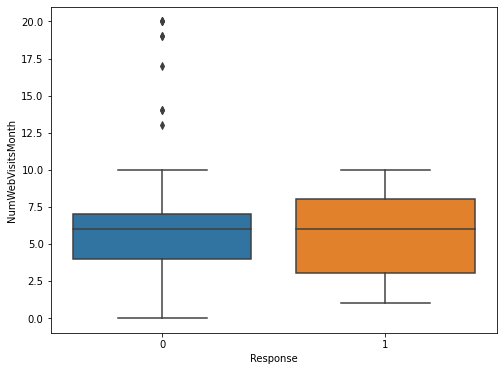

In [78]:
var = 'NumWebVisitsMonth'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [79]:
# As unicas features que parecem realmente importantes em relação a Response é 'NumWebPurchases' e 'NumCatalogPurchases'

In [ ]:
# Criando indicador

In [112]:
data['NumIndicator'] = 1*data['NumWebPurchases'] + 2*data['NumCatalogPurchases']

In [113]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.428405
TotalCost,0.473446,1.000000,0.814527,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.231497
Response,0.428405,0.265298,0.231497,1.000000


In [114]:
# Outras features

In [115]:
# Education

In [122]:
print('% people who has Basic and bought in the last campaign: ', round(len(data[(data.Education == 1) & (data.Response == 1)]) / len(data[(data.Education == 1)]) * 100, 2), "%")
print('% people who has 2nd Grade and bought in the last campaign: ', round(len(data[(data.Education == 0) & (data.Response == 1)]) / len(data[(data.Education == 0)]) * 100, 2), "%")
print('% people who has Graduation and bought in the last campaign: ', round(len(data[(data.Education == 2) & (data.Response == 1)]) / len(data[(data.Education == 2)]) * 100, 2), "%")
print('% people who has Master degree and bought in the last campaign: ', round(len(data[(data.Education == 3) & (data.Response == 1)]) / len(data[(data.Education == 3)]) * 100, 2), "%")
print('% people who has PHd degree and bought in the last campaign: ', round(len(data[(data.Education == 4) & (data.Response == 1)]) / len(data[(data.Education == 4)]) * 100, 2), "%")

% people who has Basic and bought in the last campaign:  3.7 %
% people who has 2nd Grade and bought in the last campaign:  10.84 %
% people who has Graduation and bought in the last campaign:  13.49 %
% people who has Master degree and bought in the last campaign:  15.41 %
% people who has PHd degree and bought in the last campaign:  20.78 %


In [126]:
def change_basic_2nd_grade(row):
    if row == 1:
        return 0
    elif row == 0:
        return 1
    else:
        return row
    
data['Education'] = data.Education.apply(lambda x: change_basic_2nd_grade(x))

In [127]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.031152,0.428405
TotalCost,0.473446,1.000000,0.814527,0.107610,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.106221,0.231497
Education,0.031152,0.107610,0.106221,1.000000,0.098945
Response,0.428405,0.265298,0.231497,0.098945,1.000000


In [128]:
# Marital_Status

In [132]:
def print_pct_per_type(data, column, le_encoder=None):
    for col_type in data[column].unique():
        value = round(len(data[(data[column] == col_type) & (data.Response == 1)]) / len(data[(data[column] == col_type)]) * 100, 2)
        if le_encoder is not None:
            col_type = le_encoder.inverse_transform([col_type])[0]
        print(f'% True Response in relation with {col_type} : ', value, '%')

In [134]:
print_pct_per_type(data, 'Marital_Status', le_marital)

% True Response in relation with Single :  22.08 %
% True Response in relation with Together :  10.34 %
% True Response in relation with Married :  11.34 %
% True Response in relation with Divorced :  20.69 %
% True Response in relation with Widow :  24.68 %
% True Response in relation with Alone :  33.33 %
% True Response in relation with Absurd :  50.0 %
% True Response in relation with YOLO :  50.0 %


In [ ]:
print_pct_per_type(data, 'Marital_Status', le_marital)

In [135]:
# conseguimos perceber que quanto mais sozinho a pessoa é, mais chances dela comprar nosso produto.

In [137]:
def transform_marital_status(row):
    if row in ('Together', 'Married'):
        return 0
    else:
        return 1
data['Marital_Status'] = le_marital.inverse_transform(data['Marital_Status'])
data['Marital_Status'] = data['Marital_Status'].apply(lambda x: transform_marital_status(x))

In [138]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Marital_Status,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.031152,-0.004460,0.428405
TotalCost,0.473446,1.000000,0.814527,0.107610,0.017744,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.106221,0.006019,0.231497
Education,0.031152,0.107610,0.106221,1.000000,0.008014,0.098945
Marital_Status,-0.004460,0.017744,0.006019,0.008014,1.000000,0.150075
Response,0.428405,0.265298,0.231497,0.098945,0.150075,1.000000


In [141]:
print_pct_per_type(data, 'Teenhome')

% True Response in relation with 0 :  20.47 %
% True Response in relation with 1 :  8.93 %
% True Response in relation with 2 :  9.62 %


In [142]:
print_pct_per_type(data, 'Kidhome')

% True Response in relation with 0 :  17.17 %
% True Response in relation with 1 :  12.24 %
% True Response in relation with 2 :  4.17 %


In [146]:
# Indicador:
data['IndicatorChildren'] = data.apply(lambda x: 1 if x['Kidhome'] + x['Teenhome'] == 0 else 0, axis=1)

In [147]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'IndicatorChildren', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Marital_Status,IndicatorChildren,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.031152,-0.004460,0.317018,0.428405
TotalCost,0.473446,1.000000,0.814527,0.107610,0.017744,0.524289,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.106221,0.006019,0.385998,0.231497
Education,0.031152,0.107610,0.106221,1.000000,0.008014,-0.021328,0.098945
Marital_Status,-0.004460,0.017744,0.006019,0.008014,1.000000,0.056383,0.150075
IndicatorChildren,0.317018,0.524289,0.385998,-0.021328,0.056383,1.000000,0.205134
Response,0.428405,0.265298,0.231497,0.098945,0.150075,0.205134,1.000000


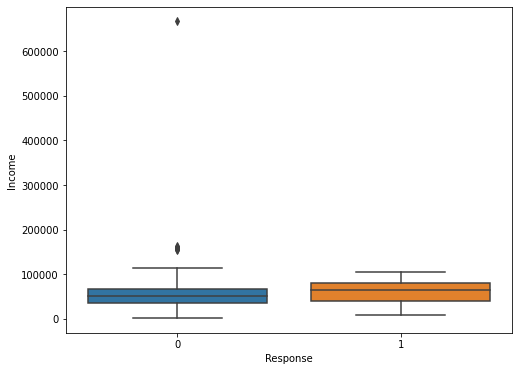

In [148]:
var = 'Income'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [150]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'IndicatorChildren', 'Income', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Marital_Status,IndicatorChildren,Income,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.031152,-0.004460,0.317018,0.320826,0.428405
TotalCost,0.473446,1.000000,0.814527,0.107610,0.017744,0.524289,0.667576,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.106221,0.006019,0.385998,0.612902,0.231497
Education,0.031152,0.107610,0.106221,1.000000,0.008014,-0.021328,0.149338,0.098945
Marital_Status,-0.004460,0.017744,0.006019,0.008014,1.000000,0.056383,-0.004663,0.150075
IndicatorChildren,0.317018,0.524289,0.385998,-0.021328,0.056383,1.000000,0.338153,0.205134
Income,0.320826,0.667576,0.612902,0.149338,-0.004663,0.338153,1.000000,0.133047
Response,0.428405,0.265298,0.231497,0.098945,0.150075,0.205134,0.133047,1.000000


In [152]:
print_pct_per_type(data, 'Complain')

% True Response in relation with 0 :  14.92 %
% True Response in relation with 1 :  14.29 %


In [156]:
# Não tem correlação nenhuma Complain-Response

In [176]:
def transform_year_birth(row):
    if row < 1950:
        return 0
    elif row >= 1950 and row < 1960:
        return 1
    elif row >= 1960 and row < 1970:
        return 2
    elif row >= 1970 and row < 1980:
        return 2
    elif row >= 1980 and row < 1990:
        return 3
    elif row >= 1990 and row < 2000:
        return 4
    else:
        return 5
data['Year_Birth'] = data['Year_Birth'].apply(lambda x: transform_year_birth(x))

In [177]:
print_pct_per_type(data, 'Year_Birth')

% True Response in relation with 1 :  12.83 %
% True Response in relation with 2 :  13.48 %
% True Response in relation with 3 :  18.46 %
% True Response in relation with 0 :  23.64 %
% True Response in relation with 4 :  22.95 %


In [ ]:
# Em geral, quanto mais jovem a pessoa é, mais chance de ela aderir a nossas promoções, e por incrivel que pareça

In [178]:
def transform_year_birth_2(row):
    if row == 0:
        return 5
    else:
        return row
data['Year_Birth'] = data['Year_Birth'].apply(lambda x: transform_year_birth_2(x))

In [179]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'IndicatorChildren', 'Income', 'Year_Birth', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Marital_Status,IndicatorChildren,Income,Year_Birth,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.031152,-0.004460,0.317018,0.320826,0.079828,0.428405
TotalCost,0.473446,1.000000,0.814527,0.107610,0.017744,0.524289,0.667576,0.057029,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.106221,0.006019,0.385998,0.612902,0.015970,0.231497
Education,0.031152,0.107610,0.106221,1.000000,0.008014,-0.021328,0.149338,0.011575,0.098945
Marital_Status,-0.004460,0.017744,0.006019,0.008014,1.000000,0.056383,-0.004663,0.015641,0.150075
IndicatorChildren,0.317018,0.524289,0.385998,-0.021328,0.056383,1.000000,0.338153,0.228045,0.205134
Income,0.320826,0.667576,0.612902,0.149338,-0.004663,0.338153,1.000000,-0.006707,0.133047
Year_Birth,0.079828,0.057029,0.015970,0.011575,0.015641,0.228045,-0.006707,1.000000,0.080984
Response,0.428405,0.265298,0.231497,0.098945,0.150075,0.205134,0.133047,0.080984,1.000000


In [188]:
data['Dt_Customer'] = data['Dt_Customer'].apply(lambda x: int(x.split('-')[0]))

In [191]:
print_pct_per_type(data, 'Dt_Customer')

% True Response in relation with 2012 :  26.72 %
% True Response in relation with 2014 :  8.62 %
% True Response in relation with 2013 :  12.95 %


In [192]:
# Quanto mais antigo, mais facil de vender o produto

In [194]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'IndicatorChildren', 'Income', 'Year_Birth','Dt_Customer', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Marital_Status,IndicatorChildren,Income,Year_Birth,Dt_Customer,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.031152,-0.004460,0.317018,0.320826,0.079828,0.027610,0.428405
TotalCost,0.473446,1.000000,0.814527,0.107610,0.017744,0.524289,0.667576,0.057029,-0.144235,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.106221,0.006019,0.385998,0.612902,0.015970,-0.130970,0.231497
Education,0.031152,0.107610,0.106221,1.000000,0.008014,-0.021328,0.149338,0.011575,0.053271,0.098945
Marital_Status,-0.004460,0.017744,0.006019,0.008014,1.000000,0.056383,-0.004663,0.015641,-0.005980,0.150075
IndicatorChildren,0.317018,0.524289,0.385998,-0.021328,0.056383,1.000000,0.338153,0.228045,-0.005700,0.205134
Income,0.320826,0.667576,0.612902,0.149338,-0.004663,0.338153,1.000000,-0.006707,0.022451,0.133047
Year_Birth,0.079828,0.057029,0.015970,0.011575,0.015641,0.228045,-0.006707,1.000000,-0.008272,0.080984
Dt_Customer,0.027610,-0.144235,-0.130970,0.053271,-0.005980,-0.005700,0.022451,-0.008272,1.000000,-0.171030
Response,0.428405,0.265298,0.231497,0.098945,0.150075,0.205134,0.133047,0.080984,-0.171030,1.000000


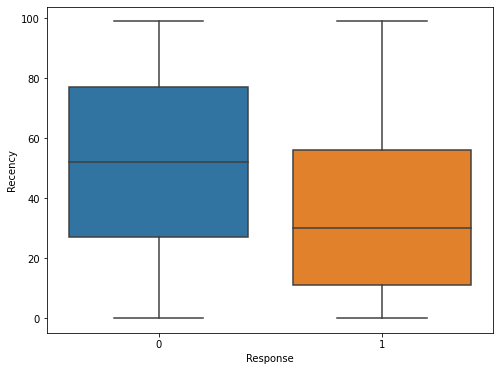

In [195]:
var = 'Recency'
sub_data = data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [197]:
# Quanto mais recente foi a ultima compra, mais facil de vender

In [198]:
data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'IndicatorChildren', 'Income', 'Year_Birth','Dt_Customer', 'Recency', 'Response']].corr()

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Marital_Status,IndicatorChildren,Income,Year_Birth,Dt_Customer,Recency,Response
AcceptedCmpIndicator,1.000000,0.473446,0.354471,0.031152,-0.004460,0.317018,0.320826,0.079828,0.027610,-0.015964,0.428405
TotalCost,0.473446,1.000000,0.814527,0.107610,0.017744,0.524289,0.667576,0.057029,-0.144235,0.020433,0.265298
NumIndicator,0.354471,0.814527,1.000000,0.106221,0.006019,0.385998,0.612902,0.015970,-0.130970,0.015893,0.231497
Education,0.031152,0.107610,0.106221,1.000000,0.008014,-0.021328,0.149338,0.011575,0.053271,-0.014737,0.098945
Marital_Status,-0.004460,0.017744,0.006019,0.008014,1.000000,0.056383,-0.004663,0.015641,-0.005980,0.004508,0.150075
IndicatorChildren,0.317018,0.524289,0.385998,-0.021328,0.056383,1.000000,0.338153,0.228045,-0.005700,-0.000505,0.205134
Income,0.320826,0.667576,0.612902,0.149338,-0.004663,0.338153,1.000000,-0.006707,0.022451,-0.003970,0.133047
Year_Birth,0.079828,0.057029,0.015970,0.011575,0.015641,0.228045,-0.006707,1.000000,-0.008272,-0.043880,0.080984
Dt_Customer,0.027610,-0.144235,-0.130970,0.053271,-0.005980,-0.005700,0.022451,-0.008272,1.000000,-0.026084,-0.171030
Recency,-0.015964,0.020433,0.015893,-0.014737,0.004508,-0.000505,-0.003970,-0.043880,-0.026084,1.000000,-0.198437


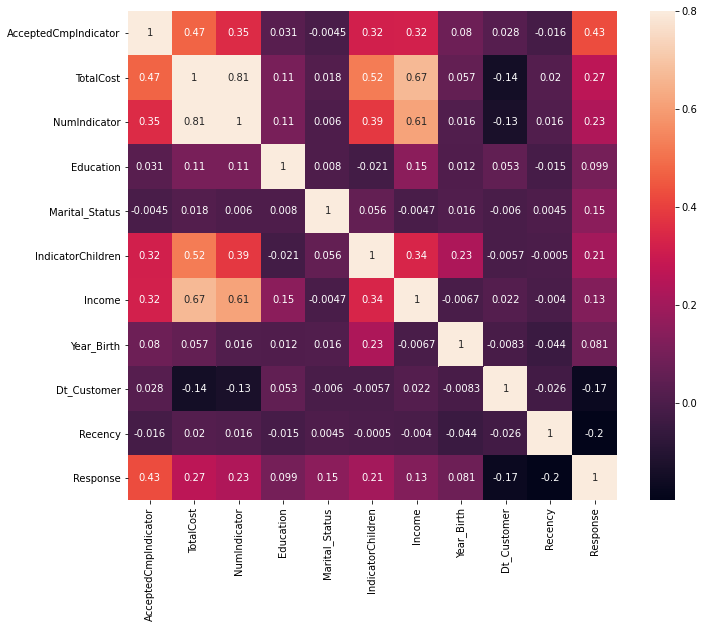

In [202]:
corrmat = data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'IndicatorChildren', 'Income', 'Year_Birth','Dt_Customer', 'Recency', 'Response']].corr()
k = 10 #number of variables for heatmap
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, annot=True,  vmax=.8, square=True);

# Visão geral:
   ### Ordem importancia
    - Pessoas que compraram nas outras promoções.
    - Pessoas que gastam muito dinheiro com produtos alimenticios.
    - Pessoas que compram pela internet ou por catalogos.
    - Compras recentes.
    - Data de afiliação(quanto mais velho, melhor)
    - Lucro dessa pessoa
    - Nivel de educação (Quanto mais instruido, melhor)
    - Quanto mais novo a pessoa for, mais chances da gente vender
   ### Target geral
    - Pessoas que compram muito online, são antigas no nosso sistema, novas em idade, fizeram compras recentes, solteiros, sem filhos e bem educados. Melhor subgrupo: Universitarios de alta renda.

In [213]:
featured_data = data[['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education', 'Marital_Status', 'IndicatorChildren', 'Income', 'Year_Birth','Dt_Customer', 'Recency', 'Response']]

In [214]:
featured_data = featured_data.sample(frac=1)

In [247]:
featured_data.dropna(subset=['Income'], inplace=True)

In [248]:
train_data = featured_data.head(round(len(featured_data)*0.8))

In [249]:
test_data = featured_data.tail(round(len(featured_data)*0.2))

In [250]:
jb.dump(test_data, 'test_data.pkl')

['test_data.pkl']

In [251]:
train_data.columns

Index(['AcceptedCmpIndicator', 'TotalCost', 'NumIndicator', 'Education',
       'Marital_Status', 'IndicatorChildren', 'Income', 'Year_Birth',
       'Dt_Customer', 'Recency', 'Response'],
      dtype='object')

In [252]:
# Eliminando anomalias

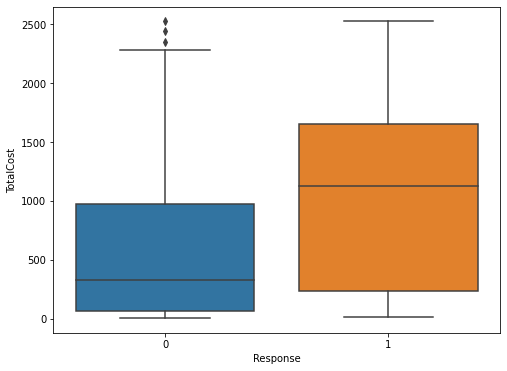

In [253]:
var = 'TotalCost'
sub_data = train_data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [254]:
train_data = train_data[~((data.Response == 0) & (data.TotalCost > 2300))]

<ipython-input-254-03195ae80594>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  train_data = train_data[~((data.Response == 0) & (data.TotalCost > 2300))]


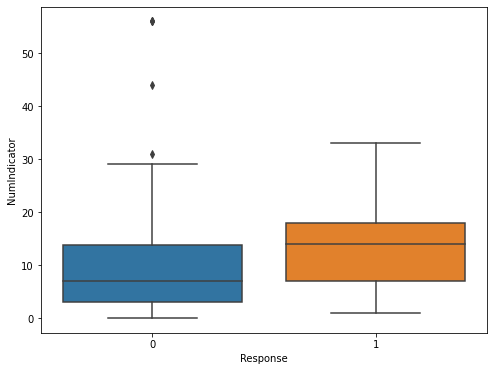

In [255]:
var = 'NumIndicator'
sub_data = train_data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [256]:
train_data = train_data[~((data.Response == 0) & (data.NumIndicator > 28))]

<ipython-input-256-61cecf575db3>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  train_data = train_data[~((data.Response == 0) & (data.NumIndicator > 28))]


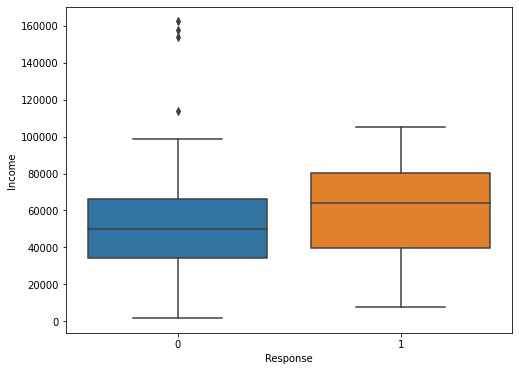

In [257]:
var = 'Income'
sub_data = train_data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [258]:
train_data = train_data[~((data.Response == 0) & (data.Income > 100000))]

<ipython-input-258-4a3ae535e49f>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  train_data = train_data[~((data.Response == 0) & (data.Income > 100000))]


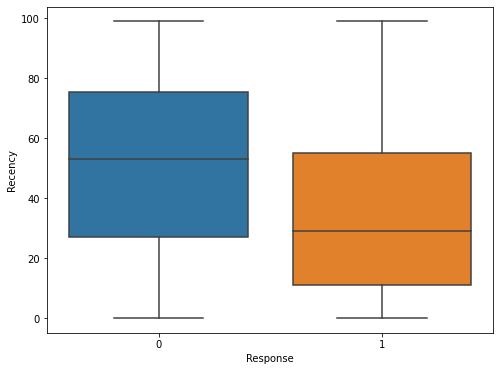

In [259]:
var = 'Recency'
sub_data = train_data[['Response', var]]
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='Response', y=var, data=sub_data)

In [260]:
jb.dump(train_data, 'train_data.pkl')

['train_data.pkl']

In [277]:
print('% de acertos Atendendo todas as condições: ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Education>=2) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30) & (featured_data.Year_Birth >= 3) & (featured_data.Dt_Customer!=2014) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Education>=2) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30) & (featured_data.Year_Birth >= 3) & (featured_data.Dt_Customer!=2014)])*100, 2))
print('% de acertos Atendendo todas as condições menos idade: ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Education>=2) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30) & (featured_data.Dt_Customer!=2014) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Education>=2) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30) & (featured_data.Dt_Customer!=2014)])*100, 2))
print('% de acertos Atendendo todas as condições menos idade, educação: ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30) & (featured_data.Dt_Customer!=2014) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30) & (featured_data.Dt_Customer!=2014)])*100, 2))
print('% de acertos Atendendo todas as condições menos idade, educação, data afiliação: ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Marital_Status == 1) & (featured_data.IndicatorChildren == 1) & (featured_data.Recency < 30)])*100, 2))
print('% de acertos Atendendo todas as condições menos idade, educação, data afiliação, filhos: ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Marital_Status == 1) & (featured_data.Recency < 30) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Marital_Status == 1) & (featured_data.Recency < 30)])*100, 2))
print('% de acertos Atendendo todas as condições menos idade, educação, data afiliação, filhos, status: ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Recency < 30) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Recency < 30)])*100, 2))
print('% de acertos Atendendo todas as condições menos idade, educação, data afiliação, filhos, status, recentes: ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.TotalCost > 800)])*100, 2))
print('% de acertos Atendendo todas as condições menos idade, educação, data afiliação, filhos, status, recentes, : ', round(len(featured_data[(featured_data.AcceptedCmpIndicator > 0) & (featured_data.Response == 1)])/len(featured_data[(featured_data.AcceptedCmpIndicator > 0)])*100, 2))

% de acertos Atendendo todas as condições:  100.0
% de acertos Atendendo todas as condições menos idade:  100.0
% de acertos Atendendo todas as condições menos idade, educação:  100.0
% de acertos Atendendo todas as condições menos idade, educação, data afiliação:  86.21
% de acertos Atendendo todas as condições menos idade, educação, data afiliação, filhos:  75.68
% de acertos Atendendo todas as condições menos idade, educação, data afiliação, filhos, status:  62.11


In [266]:
featured_data

,AcceptedCmpIndicator,TotalCost,NumIndicator,Education,Marital_Status,IndicatorChildren,Income,Year_Birth,Dt_Customer,Recency,Response
2155,0.0,66,2,1,0,0,32146.0,3,2014,16,0
1457,0.0,77,2,2,0,0,26290.0,2,2013,49,0
750,0.0,1497,26,4,0,1,83443.0,2,2013,89,0
129,0.0,661,12,4,0,0,77376.0,1,2014,72,0
915,0.0,976,11,2,0,1,62820.0,1,2013,51,0
...,...,...,...,...,...,...,...,...,...,...,...
2223,0.0,51,2,3,0,0,33562.0,2,2014,33,0
1308,6.0,1189,18,2,0,1,65169.0,3,2014,23,1
1642,0.0,612,11,2,0,0,56386.0,3,2012,51,0
61,0.0,612,8,2,0,0,66653.0,2,2012,18,0
